# Topic Modeling using BERTopic

DHH23 Parliament group

Author: Pontus H.

In [32]:
from cuml.manifold import UMAP
from cuml.cluster.hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer

from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance
from bertopic.vectorizers import ClassTfidfTransformer

import pandas as pd

Set up the BERTopic pipeline

In [33]:
# Parameters
HDBSCAN_MIN_CLUSTER_SIZE = 50
HDBSCAN_MIN_SAMPLES = 1
HDBSCAN_CLUSTER_SELECTION_EPSILON = 0

# Step 1 - Extract embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Step 2 - Reduce dimensionality
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

# Step 3 - Cluster reduced embeddings
hdbscan_model = HDBSCAN(
    min_cluster_size=HDBSCAN_MIN_CLUSTER_SIZE,
    min_samples=HDBSCAN_MIN_SAMPLES,
    cluster_selection_epsilon=HDBSCAN_CLUSTER_SELECTION_EPSILON,
    metric='euclidean',
    cluster_selection_method='eom',
    prediction_data=False)

# Step 4 - Tokenize topics
vectorizer_model = CountVectorizer(stop_words="english")

# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()

# Step 6 - (Optional) Fine-tune topic representations with 
# a `bertopic.representation` model
# representation_model = KeyBERTInspired()
representation_model = MaximalMarginalRelevance(diversity=0.8)

# All steps together
topic_model = BERTopic(
  embedding_model=embedding_model,          # Step 1 - Extract embeddings
  umap_model=umap_model,                    # Step 2 - Reduce dimensionality
  hdbscan_model=hdbscan_model,              # Step 3 - Cluster reduced embeddings
  vectorizer_model=vectorizer_model,        # Step 4 - Tokenize topics
  ctfidf_model=ctfidf_model,                # Step 5 - Extract topic words
  representation_model=representation_model, # Step 6 - (Optional) Fine-tune topic representations
  #nr_topics="25",
  n_gram_range=(1, 3),
)

In [34]:
# The data is converted from ParlaMint-GB.txt to ParlaMint-GB.feather with a filter on the Commons
# using a modified version of Bojan's notebook 'showcase - ParlaMint .txt to .csv.ipynb'
df = pd.read_feather('../data/ParlaMint-GB-commons.feather')
df_sample = df[df['Speaker_role'] == 'Regular']
df_sample = df_sample[df_sample['Speaker_MP'] == 'MP']
df_sample['speech_length'] = df_sample['speech'].apply(lambda x: len(x) if type(x) == str else 0)
df_sample = df_sample[df_sample['speech_length'] > 200]
df_sample.reset_index(inplace=True, drop=True)

In [35]:
# Reference running time for this cell: 4min 00s
topics, probs = topic_model.fit_transform(df_sample['speech'])

In [36]:
topic_model.save(f"../data/topic_model_epsilon{HDBSCAN_CLUSTER_SELECTION_EPSILON}_clustersize{HDBSCAN_MIN_CLUSTER_SIZE}.bin")

In [37]:
#topic_model = BERTopic.load("../data/topic_model_epsilon0_clustersize50.bin")

In [38]:
# Number of topics
len(pd.Series(topics).unique())

541

In [39]:
# The count of speeches per topic. -1 is the noise(outlier) topic
pd.Series(topic_model.hdbscan_model.labels_).value_counts()

-1      209089
 445      9534
 407      7455
 268      7091
 306      6393
         ...  
 431        50
 261        50
 88         50
 100        50
 500        50
Length: 541, dtype: int64

In [40]:
topic_model.visualize_topics()

Topics over time

In [41]:
# Reference running time for this cell: 2min 30s
topics_over_time = topic_model.topics_over_time(df_sample['speech'], df_sample['Date'].to_list(), nr_bins=20)

In [42]:
# Save the topics_over_time dataframe to a feather file
topics_over_time.to_feather("../data/topics_over_time.feather")

In [43]:
topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=10)
#topic_model.visualize_topics_over_time(topics_over_time, topics=[0,18])


What is interesting about the plot above is that the keywords associated with the topic CHANGE over time! Maybe this could be a useful pointer towards further exploration.

In [44]:
# Brexit
topics_over_time[topics_over_time['Topic'] == 0]

,Topic,Words,Frequency,Timestamp,Name
1,0,"trade, movement, agreement, commission, national",51,2015-01-02 05:54:14.400,0_trade_vote_brexit_withdrawal
443,0,"referendum, european, union, purdah, trade",156,2015-05-22 16:48:00.000,0_trade_vote_brexit_withdrawal
859,0,"referendum, eu, renegotiation, deal, leave",285,2015-10-07 09:36:00.000,0_trade_vote_brexit_withdrawal
1347,0,"vote, deal, membership, agreements, brexit",326,2016-02-22 02:24:00.000,0_trade_vote_brexit_withdrawal
1818,0,"trade, article, brexit, 50, vote",411,2016-07-08 19:12:00.000,0_trade_vote_brexit_withdrawal
2257,0,"trade, vote, article, 50, brexit",859,2016-11-23 12:00:00.000,0_trade_vote_brexit_withdrawal
2735,0,"trade, free, customs, brexit, vote",199,2017-04-10 04:48:00.000,0_trade_vote_brexit_withdrawal
3116,0,"trade, customs, withdrawal, vote, brexit",981,2017-08-25 21:36:00.000,0_trade_vote_brexit_withdrawal
3588,0,"customs, trade, brexit, withdrawal, vote",535,2018-01-10 14:24:00.000,0_trade_vote_brexit_withdrawal
4072,0,"customs, withdrawal, brexit, agreements, free",666,2018-05-28 07:12:00.000,0_trade_vote_brexit_withdrawal


In [53]:
topics_over_time[topics_over_time['Topic'] == 8]

,Topic,Words,Frequency,Timestamp,Name
9,8,"nato, sanctions, nuclear, president, eastern",118,2015-01-02 05:54:14.400,8_ukraine_sanctions_aggression_security
451,8,"ukraine, nato, sanctions, eastern, summit",34,2015-05-22 16:48:00.000,8_ukraine_sanctions_aggression_security
867,8,"litvinenko, sanctions, marina, anatoly, security",65,2015-10-07 09:36:00.000,8_ukraine_sanctions_aggression_security
1355,8,"nato, sanctions, security, eastern, aggression",84,2016-02-22 02:24:00.000,8_ukraine_sanctions_aggression_security
1826,8,"nato, nuclear, warsaw, sanctions, ukrainian",55,2016-07-08 19:12:00.000,8_ukraine_sanctions_aggression_security
2265,8,"nato, sanctions, estonia, eastern, mattis",93,2016-11-23 12:00:00.000,8_ukraine_sanctions_aggression_security
2743,8,"nato, devils, forces, meddling, deployments",18,2017-04-10 04:48:00.000,8_ukraine_sanctions_aggression_security
3124,8,"nato, rt, interference, kremlin, ukrainian",57,2017-08-25 21:36:00.000,8_ukraine_sanctions_aggression_security
3596,8,"nato, sanctions, salisbury, ukrainian, kremlin",222,2018-01-10 14:24:00.000,8_ukraine_sanctions_aggression_security
4080,8,"nato, salisbury, gru, sanctions, ukrainian",170,2018-05-28 07:12:00.000,8_ukraine_sanctions_aggression_security


In [46]:
topic_model.visualize_barchart(width=330, height=330, top_n_topics=10, n_words=10)

In [54]:
topic_model.visualize_barchart(width=330, height=330, topics=[0,8], n_words=20)

In [55]:
topic_model.get_representative_docs(8)

['Under Vladimir Putin, Russia is obviously testing the west, and we can rest assured that nothing of significance done by Russia will happen without Putin’s agreement. I am sure many Members will agree with me that from the Kremlin’s point of view, it is already at war with the west; we just do not recognise that. It considers war to consist of all elements of society pointing towards the west to get what they want. It is not a grey area; the Russians just slide into war, whereas we would expect some sort of declaration of it Because of my background, I am particularly interested in what happens in eastern Europe, and I declare that interest again. I visit Bosnia relatively frequently, and there is no doubt that Russia is fully supporting Republika Srpska’s bid to break up Bosnia. That is very dangerous for Europe. Indeed, it is highly likely that Putin has authorised Serbia to send weapons to Republika Srpska I was also detained in Crimea in 2005. During my involuntary extended visit

# Find topics about Warfare

In [49]:
war_topics=topic_model.find_topics("warfare")
war_topics

([20, 353, 59, 417, 48],
 [0.6642375063497515,
  0.6025263838736391,
  0.5929820915714894,
  0.5888011634403513,
  0.5721682628102508])

In [50]:
topic_model.visualize_barchart(width=330, height=330, topics=war_topics[0], n_words=10)

In [51]:
topic_model.visualize_topics_over_time(topics_over_time, topics=war_topics[0])

# Find topics about Gender

In [60]:
gender_topics = topic_model.find_topics("gender")
topic_model.visualize_barchart(width=330, height=330, topics=gender_topics[0], n_words=10)


In [59]:

topic_model.visualize_topics_over_time(topics_over_time, topics=gender_topics[0])


# Word Clouds

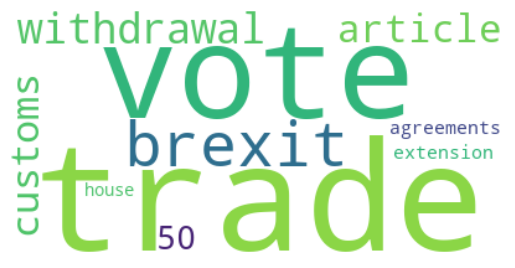

In [52]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=0)

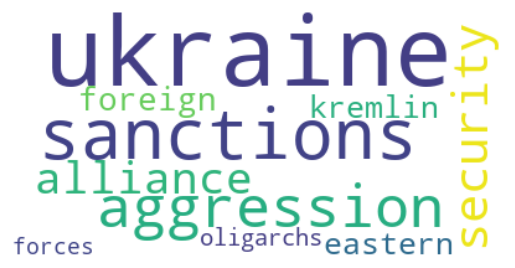

In [95]:
create_wordcloud(topic_model, topic=8)

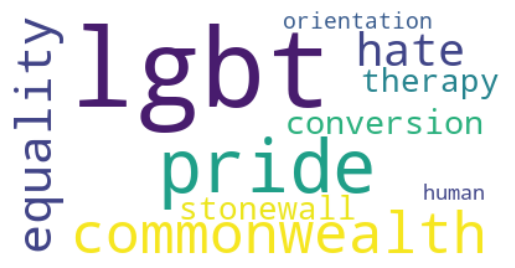

In [62]:
create_wordcloud(topic_model, topic=152)

([435, 465, 88, 14, 479], [0.5152042427378677, 0.4930113622764335, 0.4595941768268611, 0.45192416694757087, 0.4438596921604804])
['I am grateful to my hon. Friend for her remarks, and I will address that point in a moment New clause 7 would require the Chancellor of the Exchequer to “lay before both Houses of Parliament a statement on his strategy to negotiate with the European Union institutions an exemption from value added tax for women’s sanitary protection products” within three months of the passing of the Act. It would also require a Minister of the Crown to “lay before Parliament a report on progress at achieving an exemption from value added tax for women’s sanitary protection products within European Union law by 1 April 2016.” This debate has highlighted the ongoing campaign to zero-rate or exempt from VAT tampons and other sanitary protection products. As we have heard tonight, that campaign has cross-party support. In the case of the hon. Member for Walthamstow (Stella Cre

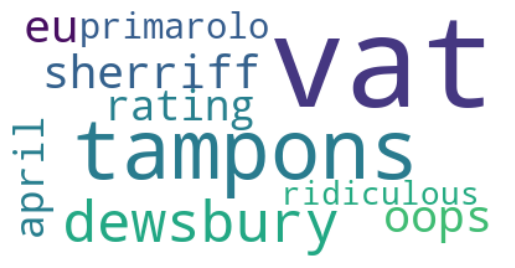

In [96]:
topic_list = topic_model.find_topics("tampon")
print(topic_list)
print(topic_model.get_representative_docs(435))
create_wordcloud(topic_model, topic=topic_list[0][0])

In [99]:
topic_model.visualize_heatmap(n_clusters=10, top_n_topics=20)